In [1]:
import pandas as pd
import numpy as np
from numpy import array

import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
import plotly.express as px

from geopy.geocoders import Nominatim
from IPython.display import Image
from datetime import datetime, timedelta, time

import keras
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.optimizers import RMSprop
from keras.callbacks import EarlyStopping
from keras.models import Sequential, load_model
from keras.layers import Dense, Activation, LSTM, TimeDistributed, Conv2D, MaxPooling2D, Flatten, Dropout
# from keras.utils import plot_model
# from keras.layers.convolutional import Conv3D
from keras.layers.convolutional_recurrent import ConvLSTM2D
from keras.layers.normalization import BatchNormalization
from sklearn import metrics

### citibikenyc

https://www.citibikenyc.com

In [2]:
stations = pd.read_json('https://feeds.citibikenyc.com/stations/stations.json')

In [3]:
stations.head()

,executionTime,stationBeanList
0,2016-01-22 04:32:49 PM,"{'id': 72, 'stationName': 'W 52 St & 11 Ave', ..."
1,2016-01-22 04:32:49 PM,"{'id': 79, 'stationName': 'Franklin St & W Bro..."
2,2016-01-22 04:32:49 PM,"{'id': 82, 'stationName': 'St James Pl & Pearl..."
3,2016-01-22 04:32:49 PM,"{'id': 83, 'stationName': 'Atlantic Ave & Fort..."
4,2016-01-22 04:32:49 PM,"{'id': 116, 'stationName': 'W 17 St & 8 Ave', ..."


In [4]:
stationBeanList = pd.json_normalize(stations['stationBeanList'])

In [5]:
stations = pd.concat([stations, stationBeanList], axis=1)
stations.head(2)

,executionTime,stationBeanList,id,stationName,availableDocks,totalDocks,latitude,longitude,statusValue,statusKey,availableBikes,stAddress1,stAddress2,city,postalCode,location,altitude,testStation,lastCommunicationTime,landMark
0,2016-01-22 04:32:49 PM,"{'id': 72, 'stationName': 'W 52 St & 11 Ave', ...",72,W 52 St & 11 Ave,32,39,40.767272,-73.993929,In Service,1,7,W 52 St & 11 Ave,,,,,,False,2016-01-22 04:30:15 PM,
1,2016-01-22 04:32:49 PM,"{'id': 79, 'stationName': 'Franklin St & W Bro...",79,Franklin St & W Broadway,0,33,40.719116,-74.006667,In Service,1,33,Franklin St & W Broadway,,,,,,False,2016-01-22 04:32:41 PM,


In [6]:
stations.drop('stationBeanList', axis=1, inplace = True)

In [7]:
stations[['executionTime','lastCommunicationTime']]= stations[['executionTime','lastCommunicationTime']].apply(pd.to_datetime, errors='coerce')

In [8]:
stations_summary = pd.concat([stations.count(),stations.dtypes, stations.nunique(),stations.isnull().sum()], axis=1, sort=False)
stations_summary.columns=['count','dtype','nunique','NaN']
stations_summary

,count,dtype,nunique,NaN
executionTime,509,datetime64[ns],1,0
id,509,int64,509,0
stationName,509,object,509,0
availableDocks,509,int64,60,0
totalDocks,509,int64,49,0
latitude,509,float64,509,0
longitude,509,float64,509,0
statusValue,509,object,2,0
statusKey,509,int64,2,0
availableBikes,509,int64,42,0


We have the data of 509 citi bike NYC stations taken on 2016-01-22 16:32:49

In [9]:
stations['statusValue'].value_counts()

In Service        504
Not In Service      5
Name: statusValue, dtype: int64

In [10]:
stations.describe()

,id,availableDocks,totalDocks,latitude,longitude,statusKey,availableBikes
count,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000
mean,1438.563851,21.502947,32.779961,40.728369,-73.983516,1.015717,10.534381
std,1334.345344,12.749035,11.397900,0.026755,0.028253,0.176773,10.171236
min,72.000000,0.000000,0.000000,40.678907,-74.096937,1.000000,0.000000
25%,346.000000,12.000000,24.000000,40.708771,-73.997044,1.000000,2.000000
50%,488.000000,20.000000,31.000000,40.725603,-73.982614,1.000000,7.000000
75%,3102.000000,28.000000,39.000000,40.749156,-73.962644,1.000000,16.000000
max,3244.000000,62.000000,67.000000,40.787209,-73.929891,3.000000,46.000000


The total docks mean is of 32 with a standard deviation of 11. The maximum per station reaches 67  docks. 75% of them having 39 docks.<br> <br>
On 2016-01-22 16:32:4, we also observe the following figures:<br>
The available docks mean was of 21 with a standard deviation of 12. The maximum per station reached 62 docks. 75% of them had 28 available docks.<br> 
The available bikes mean was of 10 with a standard deviation of 10. The maximum per station reached 46 bikes. 75% of them had 16 available bikes.<br> 

In [11]:
print('longitude min {} max {}'.format(stations.longitude.min(), stations.longitude.max()))
print('latitude min {} max {}'.format(stations.latitude.min(), stations.latitude.max()))

longitude min -74.0969366 max -73.9298911
latitude min 40.67890679 max 40.78720869


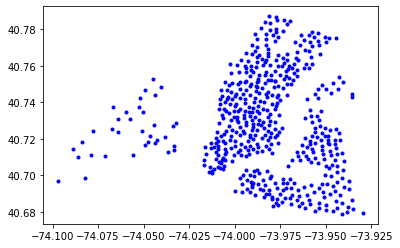

In [12]:
plt.plot(stations.longitude, stations.latitude, 'b.')

In [13]:
# Using the Geopy library
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent='bike_stations')

In [14]:
def rever_geo(x):
    try:
        result = str(geolocator.reverse((x['latitude'], x['longitude'])))
        return  result.split(', ')[4]
    except Exception:
        pass

In [15]:
# Geopy speed is to improve/replace
stations['borough'] = stations.apply(rever_geo, axis=1)

In [16]:
stations['borough'].value_counts()

Manhattan                      280
Kings County                   118
New York                        47
Hudson County                   21
Queens County                    9
New Jersey                       9
Jersey City                      5
Manhattan Community Board 7      3
Manhattan Community Board 5      3
New York County                  2
Manhattan Community Board 8      2
Manhattan Community Board 6      2
Brooklyn                         1
11211                            1
Manhattan Community Board 2      1
Manhattan Community Board 4      1
Times Square                     1
Manhattan Community Board 1      1
Queens                           1
10075-0381                       1
Name: borough, dtype: int64

In [17]:
stations['borough'].fillna('New York',inplace=True)

In [18]:
stations.loc[stations['borough'].str.contains('Manhattan'), 'borough'] = 'Manhattan'
stations.loc[stations['borough'].str.contains('Times Square'), 'borough'] = 'Manhattan'
stations.loc[stations['borough'].str.contains('10075-0381'), 'borough'] = 'Manhattan'
stations.loc[stations['borough'].str.contains('New York County'), 'borough'] = 'Manhattan'
stations.loc[stations['borough'].str.contains('Kings County'), 'borough'] = 'Brooklyn'
stations.loc[stations['borough'].str.contains('11211'), 'borough'] = 'Brooklyn'
stations.loc[stations['borough'].str.contains('Queens'), 'borough'] = 'Queens'
# Jersey City and Hudson County  are in New jersey which is not considered part of new york city boroughs. We will classify them under STATEN ISLAND for longitude proximity 
stations.loc[stations['borough'].str.contains('New Jersey'), 'borough'] = 'Staten Island'
stations.loc[stations['borough'].str.contains('Jersey City'), 'borough'] = 'Staten Island'
stations.loc[stations['borough'].str.contains('Hudson County'), 'borough'] = 'Staten Island'

In [19]:
stations['borough'].value_counts()

Manhattan        297
Brooklyn         120
New York          47
Staten Island     35
Queens            10
Name: borough, dtype: int64

In [20]:
fig = px.scatter(stations, x=stations.longitude,y=stations.latitude, size=stations.totalDocks, hover_name=stations.stationName, title='Stations coordinates', color=stations.borough)
fig.show()

Manhattan, Brooklyn, Queens and Staten Island boroughs are clearly showing. The "New York" labelled data is spread over the map. This can be further cleaned. The bronx label is missing. It should be included in parts of the Manhattan data. This can also be further adjusted (for example by selecting parts of the new Manhattan data from some latitude level). 

### Motor Vehicle Collisions data

The Motor Vehicle Collisions data tables contain information from all police reported motor vehicle collisions in NYC. The police report (MV104-AN) is required to be filled out for collisions where someone is injured or killed, or where there is at least $1000 worth of damage (https://www.nhtsa.gov/sites/nhtsa.dot.gov/files/documents/ny_overlay_mv-104an_rev05_2004.pdf). It should be noted that the data is preliminary and subject to change when the MV-104AN forms are amended based on revised crash details.For the most accurate, up to date statistics on traffic fatalities, please refer to the NYPD Motor Vehicle Collisions page (updated weekly) or Vision Zero View (updated monthly).


TrafficStat, which uses the CompStat model to work towards improving traffic safety. Police officers complete form MV-104AN for all vehicle collisions. The MV-104AN is a New York State form that has all of the details of a traffic collision. Before implementing Trafficstat, there was no uniform traffic safety data collection procedure for all of the NYPD precincts. Therefore, the Police Department implemented the Traffic Accident Management System (TAMS) in July 1999 in order to collect traffic data in a uniform method across the City. TAMS required the precincts manually enter a few selected MV-104AN fields to collect very basic intersection traffic crash statistics which included the number of accidents, injuries and fatalities. As the years progressed, there grew a need for additional traffic data so that more detailed analyses could be conducted. The Citywide traffic safety initiative, Vision Zero started in the year 2014. Vision Zero further emphasized the need for the collection of more traffic data in order to work towards the Vision Zero goal, which is to eliminate traffic fatalities. Therefore, the Department in March 2016 replaced the TAMS with the new Finest Online Records Management System (FORMS). FORMS enables the police officers to electronically, using a Department cellphone or computer, enter all of the MV-104AN data fields and stores all of the MV-104AN data fields in the Department’s crime data warehouse. Since all of the MV-104AN data fields are now stored for each traffic collision, detailed traffic safety analyses can be conducted as applicable.<br>
https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Crashes/h9gi-nx95

Date Made Public:	5/7/2014 <br>
Agency:	Police Department (NYPD) <br>
Data Collection: Data Collection Motor Vehicle Collisions <br>
Attachments:  MVCollisionsDataDictionary_20190813_ERD.xlsx


In [21]:
# from google.colab import drive
# drive.mount('/content/drive')

In [22]:
# collisions = pd.read_csv('/content/drive/My Drive/Motor_Vehicle_Collisions_-_Crashes.csv',parse_dates=[['CRASH DATE', 'CRASH TIME']])
collisions = pd.read_csv('Motor_Vehicle_Collisions_-_Crashes.csv',parse_dates=[['CRASH DATE', 'CRASH TIME']])

/Users/MacBookPro/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3071: DtypeWarning:

Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.



In [23]:
collisions.head(2)

,CRASH DATE_CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,NUMBER OF PERSONS INJURED,...,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
0,2020-10-21 19:18:00,NaN,NaN,40.819042,-73.930750,"(40.819042, -73.93075)",MAJOR DEEGAN EXPRESSWAY,NaN,NaN,0.0,...,Unspecified,NaN,NaN,NaN,4360063,Sedan,Stake or Rack,NaN,NaN,NaN
1,2020-11-30 09:00:00,MANHATTAN,10023,40.774704,-73.988205,"(40.774704, -73.988205)",WEST 64 STREET,WEST END AVENUE,NaN,1.0,...,NaN,NaN,NaN,NaN,4371976,Sedan,NaN,NaN,NaN,NaN


In [24]:
collisions.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1754424 entries, 0 to 1754423
Columns: 28 entries, CRASH DATE_CRASH TIME to VEHICLE TYPE CODE 5
dtypes: datetime64[ns](1), float64(4), int64(7), object(16)
memory usage: 374.8+ MB


In [25]:
collisions_summary = pd.concat([collisions.count(),collisions.dtypes, collisions.nunique(),collisions.isnull().sum()], axis=1, sort=False)
collisions_summary.columns=['count','dtype','nunique','NaN']
collisions_summary

,count,dtype,nunique,NaN
CRASH DATE_CRASH TIME,1754424,datetime64[ns],902940,0
BOROUGH,1215853,object,5,538571
ZIP CODE,1215642,object,448,538782
LATITUDE,1546248,float64,118601,208176
LONGITUDE,1546248,float64,93196,208176
LOCATION,1546248,object,227530,208176
ON STREET NAME,1401406,object,12083,353018
CROSS STREET NAME,1139065,object,18847,615359
OFF STREET NAME,260650,object,159789,1493774
NUMBER OF PERSONS INJURED,1754406,float64,27,18


In [26]:
collisions.describe()

,LATITUDE,LONGITUDE,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,COLLISION_ID
count,1.546248e+06,1.546248e+06,1.754406e+06,1.754393e+06,1.754424e+06,1.754424e+06,1.754424e+06,1.754424e+06,1.754424e+06,1.754424e+06,1.754424e+06
mean,4.069046e+01,-7.386770e+01,2.723087e-01,1.252855e-03,5.143739e-02,6.577657e-04,2.280236e-02,9.575792e-05,1.979037e-01,4.981692e-04,2.904963e+06
std,1.173895e+00,2.378752e+00,6.675773e-01,3.744016e-02,2.333291e-01,2.618841e-02,1.508606e-01,9.843210e-03,6.292971e-01,2.441228e-02,1.503032e+06
min,0.000000e+00,-2.013600e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.200000e+01
25%,4.066864e+01,-7.397606e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.864450e+06
50%,4.072221e+01,-7.392848e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.513368e+06
75%,4.076880e+01,-7.386667e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.952211e+06
max,4.334444e+01,0.000000e+00,4.300000e+01,8.000000e+00,2.700000e+01,6.000000e+00,4.000000e+00,2.000000e+00,4.300000e+01,5.000000e+00,4.391302e+06


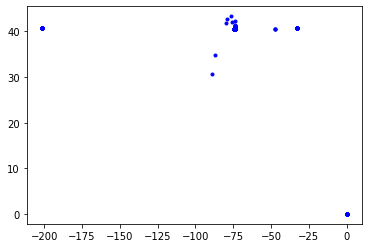

In [27]:
plt.plot(collisions.LONGITUDE, collisions.LATITUDE, 'b.')

In [28]:
collisions.loc[collisions['LONGITUDE'] == 0, ["LONGITUDE", "LATITUDE"]] = np.nan

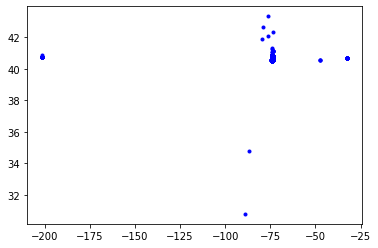

In [29]:
plt.plot(collisions.LONGITUDE, collisions.LATITUDE, 'b.')

In [30]:
collisions.drop(collisions[collisions.LONGITUDE <-125].index, inplace=True)

In [31]:
collisions.drop(collisions[collisions.LATITUDE <36].index, inplace=True)

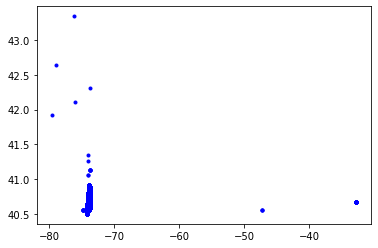

In [32]:
plt.plot(collisions.LONGITUDE, collisions.LATITUDE, 'b.')

In [33]:
collisions.drop(collisions[collisions.LONGITUDE >-50].index, inplace=True)

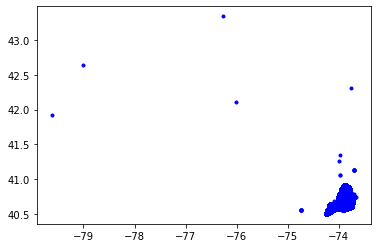

In [34]:
plt.plot(collisions.LONGITUDE, collisions.LATITUDE, 'b.')

In [35]:
collisions.drop(collisions[collisions.LATITUDE >41].index, inplace=True)

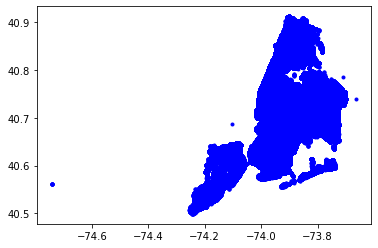

In [36]:
plt.plot(collisions.LONGITUDE, collisions.LATITUDE, 'b.')

In [37]:
collisions.drop(collisions[collisions.LONGITUDE < -74.4].index, inplace=True)

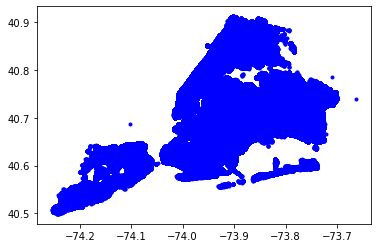

In [38]:
plt.plot(collisions.LONGITUDE, collisions.LATITUDE, 'b.')

In [39]:
collisions.describe()

,LATITUDE,LONGITUDE,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,COLLISION_ID
count,1.544819e+06,1.544819e+06,1.754257e+06,1.754244e+06,1.754275e+06,1.754275e+06,1.754275e+06,1.754275e+06,1.754275e+06,1.754275e+06,1.754275e+06
mean,4.072417e+01,-7.392061e+01,2.723227e-01,1.252961e-03,5.144176e-02,6.578216e-04,2.280429e-02,9.576606e-05,1.979114e-01,4.982115e-04,2.904894e+06
std,7.863407e-02,8.633307e-02,6.675936e-01,3.744175e-02,2.333385e-01,2.618952e-02,1.508669e-01,9.843628e-03,6.293122e-01,2.441331e-02,1.503077e+06
min,4.049895e+01,-7.425453e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.200000e+01
25%,4.066874e+01,-7.397617e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.864412e+06
50%,4.072227e+01,-7.392854e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.513308e+06
75%,4.076888e+01,-7.386681e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.952242e+06
max,4.091288e+01,-7.366301e+01,4.300000e+01,8.000000e+00,2.700000e+01,6.000000e+00,4.000000e+00,2.000000e+00,4.300000e+01,5.000000e+00,4.391302e+06


### Question I

• What is the most dangerous NYC borough / area for a bicycle rider? Use visualization. <br>

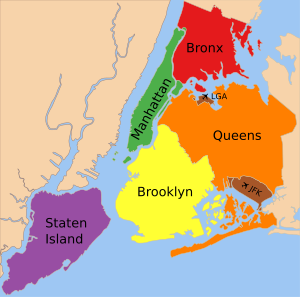

In [40]:
from IPython.display import Image
Image(filename='300px-5_Boroughs_Labels_New_York_City_Map.svg.png') 

In [41]:
collisions['BOROUGH'].value_counts()

BROOKLYN         380843
QUEENS           325564
MANHATTAN        283592
BRONX            174272
STATEN ISLAND     51580
Name: BOROUGH, dtype: int64

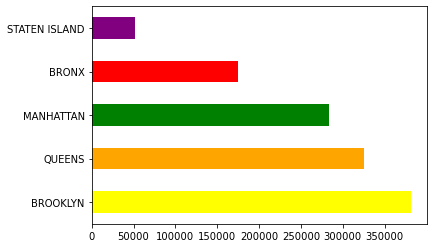

In [42]:
collisions['BOROUGH'].value_counts().plot(kind='barh', color=['yellow', 'orange', 'g','r', 'purple'])

A quick look at the available data, shows that Brookly and the queens have the most collisions. Followed by Manhattan then the Bronx. <br>
We can also do the following data cleaning for a more in-depth analysis: <br>
- Adding some of the missing data 
- Check collisions involving bicycles: Cyclists injured/killed - type of vehicle
- Check the values integrating the datetime values

In [43]:
pd.set_option('display.max_columns', None)

In [44]:
collisions.groupby('BOROUGH').describe()

LATITUDE                                                        \
                  count       mean       std        min        25%        50%   
BOROUGH                                                                         
BRONX          168487.0  40.848902  0.026242  40.543148  40.827507  40.846129   
BROOKLYN       372000.0  40.655905  0.035557  40.552967  40.630695  40.658398   
MANHATTAN      274597.0  40.764353  0.036845  40.583485  40.739498  40.758533   
QUEENS         318149.0  40.719006  0.040778  40.554388  40.692782  40.724160   
STATEN ISLAND   50190.0  40.588452  0.036765  40.498949  40.559624  40.592154   

                                    LONGITUDE                                  \
                     75%        max     count       mean       std        min   
BOROUGH                                                                         
BRONX          40.869568  40.912884  168487.0 -73.881816  0.029416 -74.169876   
BROOKLYN       40.681774  40.904280  372000.0 -73.951199  0.037246 -74.194600   
MANHATTAN      40.784515  40.904600  274597.0 -73.975301  0.022892 -74.123400   
QUEENS         40.752030  40.902670  318149.0 -73.831459  0.060354 -74.169750   
STATEN ISLAND  40.619000  40.908127   50190.0 -74.125803  0.045232 -74.254532   

                                                           \
                     25%        50%        75%        max   
BOROUGH                                                     
BRONX         -73.905623 -73.886420 -73.858680 -73.715400   
BROOKLYN      -73.979168 -73.952678 -73.924920 -73.720540   
MANHATTAN     -73.993119 -73.980180 -73.957810 -73.730220   
QUEENS        -73.879789 -73.829573 -73.783352 -73.700550   
STATEN ISLAND -74.155820 -74.114494 -74.089442 -73.813614   

              NUMBER OF PERSONS INJURED                                     \
                                  count      mean       std  min  25%  50%   
BOROUGH                                                                      
BRONX                          174271.0  0.292636  0.702201  0.0  0.0  0.0   
BROOKLYN                       380839.0  0.296947  0.688847  0.0  0.0  0.0   
MANHATTAN                      283589.0  0.180818  0.497926  0.0  0.0  0.0   
QUEENS                         325561.0  0.268653  0.652534  0.0  0.0  0.0   
STATEN ISLAND                   51580.0  0.257309  0.657545  0.0  0.0  0.0   

                         NUMBER OF PERSONS KILLED                           \
               75%   max                    count      mean       std  min   
BOROUGH                                                                      
BRONX          0.0  31.0                 174265.0  0.001050  0.032565  0.0   
BROOKLYN       0.0  43.0                 380838.0  0.001205  0.035959  0.0   
MANHATTAN      0.0  27.0                 283586.0  0.000882  0.032837  0.0   
QUEENS         0.0  32.0                 325560.0  0.001281  0.038972  0.0   
STATEN ISLAND  0.0  22.0                  51579.0  0.001454  0.039109  0.0   

                                  NUMBER OF PEDESTRIANS INJURED            \
               25%  50%  75%  max                         count      mean   
BOROUGH                                                                     
BRONX          0.0  0.0  0.0  2.0                      174272.0  0.068617   
BROOKLYN       0.0  0.0  0.0  3.0                      380843.0  0.065266   
MANHATTAN      0.0  0.0  0.0  8.0                      283592.0  0.060686   
QUEENS         0.0  0.0  0.0  5.0                      325564.0  0.052656   
STATEN ISLAND  0.0  0.0  0.0  2.0                       51580.0  0.038484   

                                                   \
                    std  min  25%  50%  75%   max   
BOROUGH                                             
BRONX          0.267042  0.0  0.0  0.0  0.0   9.0   
BROOKLYN       0.260035  0.0  0.0  0.0  0.0   9.0   
MANHATTAN      0.254495  0.0  0.0  0.0  0.0  27.0   
QUEENS         0.236648  0.0  0.0  0.0  0.0

With the current state of the data, we find that:<br>
- The number of cyclists both injured or killed is at its highest in Brooklyn and Manhattan.<br>
- The pedestrian and motorists data show different trends which leads to suspect that indeed Brooklyn and Manhattan are higher risk boroughs for bicycle riders.

--> The most dangerous NYC borough / area for a bicycle rider is Brooklyn. It is followed by Manhattan and the Queens.

### Question II

• What would you change in the locations of bike stations to increase safety? Use visualization.  <br>

In [45]:
cyclists = collisions[(collisions['NUMBER OF CYCLIST INJURED'] > 0) | (collisions['NUMBER OF CYCLIST KILLED'] > 0)] 

In [46]:
cyclists['NUMBER OF CYCLIST INJURED'].value_counts()

1    39216
2      373
0      162
3       13
4        1
Name: NUMBER OF CYCLIST INJURED, dtype: int64

In [47]:
cyclists['NUMBER OF CYCLIST KILLED'].value_counts()

0    39598
1      166
2        1
Name: NUMBER OF CYCLIST KILLED, dtype: int64

In [48]:
cyclists.rename(str.lower, axis='columns', inplace=True)

/Users/MacBookPro/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4125: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [49]:
cyclists['contributing factor vehicle 1'].value_counts().head(10)

Unspecified                                              11887
Driver Inattention/Distraction                            9472
Failure to Yield Right-of-Way                             4366
Pedestrian/Bicyclist/Other Pedestrian Error/Confusion     2481
Passenger Distraction                                     1546
Traffic Control Disregarded                               1513
Passing or Lane Usage Improper                            1071
Other Vehicular                                            874
Turning Improperly                                         583
Following Too Closely                                      553
Name: contributing factor vehicle 1, dtype: int64

In [50]:
cyclists['borough'].value_counts()

BROOKLYN         12442
MANHATTAN         9143
QUEENS            6199
BRONX             3205
STATEN ISLAND      357
Name: borough, dtype: int64

Text(0.5, 1.0, 'Cyclist injured and killed collisions')

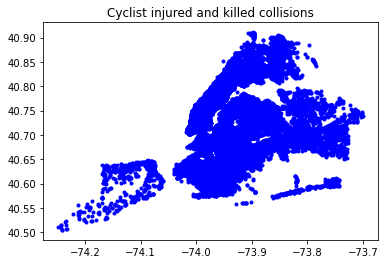

In [51]:
plt.plot(cyclists.longitude, cyclists.latitude, 'b.')
plt.title('Cyclist injured and killed collisions')

In [52]:
cyclists[['crash date_crash time','borough','zip code','latitude','longitude','number of cyclist injured','number of cyclist killed','contributing factor vehicle 1','vehicle type code 1','vehicle type code 2','collision_id']].head(2)

,crash date_crash time,borough,zip code,latitude,longitude,number of cyclist injured,number of cyclist killed,contributing factor vehicle 1,vehicle type code 1,vehicle type code 2,collision_id
11,2020-11-11 12:20:00,BROOKLYN,11226,40.650670,-73.95248,1,0,Driver Inattention/Distraction,Bike,Sedan,4366576
13,2020-10-19 09:55:00,BROOKLYN,11211,40.708424,-73.95134,1,0,Failure to Yield Right-of-Way,Taxi,E-Bike,4359994


In [53]:
stations[['stationName','latitude','longitude','borough','totalDocks']].head(2)

,stationName,latitude,longitude,borough,totalDocks
0,W 52 St & 11 Ave,40.767272,-73.993929,Manhattan,39
1,Franklin St & W Broadway,40.719116,-74.006667,Manhattan,33


In [54]:
cyclists = pd.merge(cyclists[['crash date_crash time','borough','zip code','latitude','longitude','number of cyclist injured','number of cyclist killed','contributing factor vehicle 1','vehicle type code 1','vehicle type code 2','collision_id']], stations[['stationName','latitude','longitude','borough','totalDocks']], on=['longitude','latitude'], how='outer')

In [55]:
cyclists.head(2)

,crash date_crash time,borough_x,zip code,latitude,longitude,number of cyclist injured,number of cyclist killed,contributing factor vehicle 1,vehicle type code 1,vehicle type code 2,collision_id,stationName,borough_y,totalDocks
0,2020-11-11 12:20:00,BROOKLYN,11226,40.65067,-73.95248,1.0,0.0,Driver Inattention/Distraction,Bike,Sedan,4366576.0,NaN,NaN,NaN
1,2020-07-28 13:06:00,BROOKLYN,11226,40.65067,-73.95248,1.0,0.0,Unspecified,Bike,Sedan,4334181.0,NaN,NaN,NaN


In [56]:
cyclists_summary = pd.concat([cyclists.count(),cyclists.dtypes, cyclists.nunique(),cyclists.isnull().sum()], axis=1, sort=False)
cyclists_summary.columns=['count','dtype','nunique','NaN']
cyclists_summary

,count,dtype,nunique,NaN
crash date_crash time,39765,datetime64[ns],38497,509
borough_x,31346,object,5,8928
zip code,31345,object,379,8929
latitude,37190,float64,21176,3084
longitude,37190,float64,19324,3084
number of cyclist injured,39765,float64,5,509
number of cyclist killed,39765,float64,3,509
contributing factor vehicle 1,39747,object,56,527
vehicle type code 1,39745,object,110,529
vehicle type code 2,36334,object,74,3940


In [57]:
len(cyclists)

40274

In [58]:
cyclists.loc[cyclists['collision_id'].notnull(),'collision_id'] = 'collision'

In [59]:
cyclists['collision_id'].fillna('bike_station', inplace=True)

In [60]:
cyclists.rename(columns={'collision_id':'type'}, inplace=True)

In [61]:
# Try different zoom levels
fig = px.scatter(cyclists, x='longitude',y='latitude', hover_name='type',  hover_data=['stationName', 'totalDocks','crash date_crash time','number of cyclist injured','number of cyclist killed','contributing factor vehicle 1','vehicle type code 1'], title='Bike accidents and Stations', color='type')
fig.show()

There are regions with lower bike stations densities and others not covered yet. <br>
We should expend in both:
- Regions with low bike stations coverage but high population density and prone to some activites (like tourism, work, sport...)<br>
- Extend to regions that are not covered yet (first understand the areas needs)

### Question III

• Where can an accident occur and how close is this from the nearest bike station? Create a predictive model 

In [62]:
collisions['CYCLIST'] = 0

In [63]:
collisions.head()

,CRASH DATE_CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5,CYCLIST
0,2020-10-21 19:18:00,NaN,NaN,40.819042,-73.930750,"(40.819042, -73.93075)",MAJOR DEEGAN EXPRESSWAY,NaN,NaN,0.0,0.0,0,0,0,0,0,0,Passing or Lane Usage Improper,Unspecified,NaN,NaN,NaN,4360063,Sedan,Stake or Rack,NaN,NaN,NaN,0
1,2020-11-30 09:00:00,MANHATTAN,10023,40.774704,-73.988205,"(40.774704, -73.988205)",WEST 64 STREET,WEST END AVENUE,NaN,1.0,0.0,1,0,0,0,0,0,Driver Inattention/Distraction,NaN,NaN,NaN,NaN,4371976,Sedan,NaN,NaN,NaN,NaN,0
2,2020-11-08 07:35:00,QUEENS,11367,40.732250,-73.817690,"(40.73225, -73.81769)",NaN,NaN,67-78 152 STREET,0.0,0.0,0,0,0,0,0,0,Unspecified,NaN,NaN,NaN,NaN,4365394,Sedan,NaN,NaN,NaN,NaN,0
3,2020-12-05 01:37:00,NaN,NaN,40.738598,-73.795230,"(40.738598, -73.79523)",LONG ISLAND EXPRESSWAY,NaN,NaN,1.0,0.0,0,0,0,0,1,0,Pavement Slippery,NaN,NaN,NaN,NaN,4373212,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,NaN,0
4,2020-12-04 17:00:00,NaN,NaN,40.686996,-73.956850,"(40.686996, -73.95685)",LEXINGTON AVENUE,NaN,NaN,0.0,0.0,0,0,0,0,0,0,Following Too Closely,Following Too Closely,Unspecified,NaN,NaN,4373694,Sedan,Sedan,Sedan,NaN,NaN,0


In [64]:
collisions.loc[(collisions['NUMBER OF CYCLIST INJURED'] > 0) | (collisions['NUMBER OF CYCLIST KILLED'] > 0), 'CYCLIST'] =1

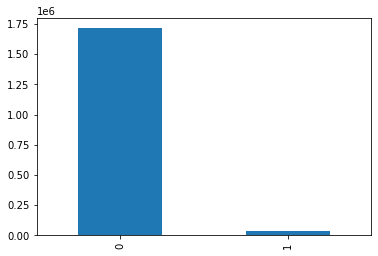

In [65]:
collisions['CYCLIST'].value_counts().plot.bar()

Problem identification: biased (oversampling or undersampling ) + timeseries + Geolocation

In [66]:
collisions[collisions['CYCLIST']== 1]['CRASH DATE_CRASH TIME'].describe()

count                   39765
unique                  38497
top       2018-07-24 17:30:00
freq                        4
first     2012-07-01 02:30:00
last      2021-02-09 23:25:00
Name: CRASH DATE_CRASH TIME, dtype: object

In [67]:
collisions[collisions['CYCLIST']== 0]['CRASH DATE_CRASH TIME'].describe()

count                 1714510
unique                 888283
top       2015-01-18 08:00:00
freq                       51
first     2012-07-01 00:05:00
last      2021-02-09 23:56:00
Name: CRASH DATE_CRASH TIME, dtype: object

In [68]:
collisions[collisions['CYCLIST']== 1]['CRASH DATE_CRASH TIME'].value_counts().head(5)

2018-07-24 17:30:00    4
2017-07-19 20:30:00    3
2016-04-07 23:00:00    3
2017-05-28 19:15:00    3
2016-09-20 14:45:00    3
Name: CRASH DATE_CRASH TIME, dtype: int64

In [69]:
collisions.rename(str.lower, axis='columns', inplace=True)

In [70]:
lat_max, lat_min = collisions['latitude'].max(), collisions['latitude'].min()
lon_max, lon_min = collisions['longitude'].max(), collisions['longitude'].min()

In [71]:
#setting up 2D array. divide max and min values of coordinates into regular intervals
yedges = np.linspace(lat_min, lat_max, 65) 
xedges = np.linspace(lon_min, lon_max, 65)

In [72]:
#generate the histogram using bins defined above
hist, yedges, xedges  = np.histogram2d(collisions['latitude'], collisions['longitude'], bins=(yedges, xedges))

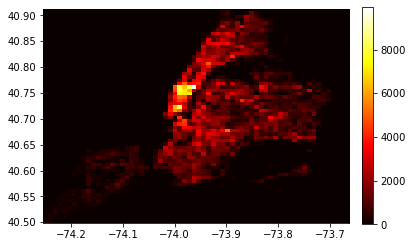

In [73]:
plt.imshow(hist, interpolation='nearest', cmap='hot', origin='low', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
plt.colorbar(fraction=0.046, pad=0.04)

In [74]:
collisions.head(1)

,crash date_crash time,borough,zip code,latitude,longitude,location,on street name,cross street name,off street name,number of persons injured,number of persons killed,number of pedestrians injured,number of pedestrians killed,number of cyclist injured,number of cyclist killed,number of motorist injured,number of motorist killed,contributing factor vehicle 1,contributing factor vehicle 2,contributing factor vehicle 3,contributing factor vehicle 4,contributing factor vehicle 5,collision_id,vehicle type code 1,vehicle type code 2,vehicle type code 3,vehicle type code 4,vehicle type code 5,cyclist
0,2020-10-21 19:18:00,NaN,NaN,40.819042,-73.93075,"(40.819042, -73.93075)",MAJOR DEEGAN EXPRESSWAY,NaN,NaN,0.0,0.0,0,0,0,0,0,0,Passing or Lane Usage Improper,Unspecified,NaN,NaN,NaN,4360063,Sedan,Stake or Rack,NaN,NaN,NaN,0


In [75]:
collisions.set_index('crash date_crash time',inplace=True)

In [76]:
accidents_list = []

for i in pd.date_range(start='2012-07-01', end='2021-02-08', freq='D'):   
    hist, yedges, xedges  = np.histogram2d(collisions.loc[(collisions.index >= i) & (collisions.index < (i + timedelta(days=1)))].latitude, collisions.loc[(collisions.index >= i) & (collisions.index < (i + timedelta(days=1)))].longitude, bins=(yedges, xedges))                                        
    accidents_list.append(hist)

accidents_array = np.array(accidents_list)
print('Accident array shape:', accidents_array.shape)                                                                  


Accident array shape: (3145, 64, 64)


In [77]:
accidents_array_reshape = accidents_array.reshape(3145,64,64,1)

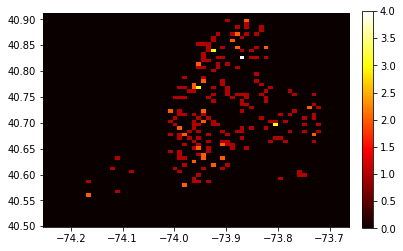

In [78]:
# Plotting of one day of accidents
plt.imshow(accidents_array[3144], interpolation='nearest', cmap='hot', origin='low',extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
plt.colorbar(fraction=0.046, pad=0.04)

In [79]:
# The array length will reduce from 3145 to 3139 due to the frequency summing of 7 arrays 
array_of_frequency = np.zeros(shape=(3139,64,64)) 
for i in range(3139):
        array_of_frequency[i] = (accidents_array[i] + accidents_array[i+1] + accidents_array[i+2] + accidents_array[i+3] + accidents_array[i+4] + accidents_array[i+5] + accidents_array[i+6])/7

In [80]:
array_of_frequency_reshape = array_of_frequency.reshape(3139,64,64,1)

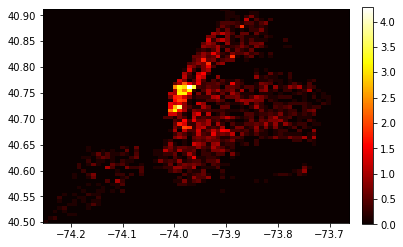

In [81]:
# Plotting of the frequency
plt.imshow(array_of_frequency[12], interpolation='nearest', cmap='hot', origin='low', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
plt.colorbar(fraction=0.046, pad=0.04)

### The Prediction 

#### A classification model

In [82]:
# Not descriminate between a single accident or many accidents 
array_of_frequency_reshape[array_of_frequency_reshape > 0] = 1

In [83]:
len(array_of_frequency_reshape[array_of_frequency_reshape==1])

3001679

In [84]:
array_of_frequency_reshape.shape

(3139, 64, 64, 1)

In [85]:
# Splitting the data to train, test and validation datasets 70|20|10    
train_array = array_of_frequency_reshape[:2197]
test_array = array_of_frequency_reshape[2197:-314]
validate_array = array_of_frequency_reshape[-314:]

len(train_array), len(test_array), len(validate_array)

(2197, 628, 314)

Training the model on the preceeding 7 days to prdict the 8th (using keras TimeseriesGenerator)

In [86]:
n_input = 7    

train_generator = TimeseriesGenerator(train_array, train_array, length=n_input, batch_size=1) 
test_generator = TimeseriesGenerator(test_array, test_array, length=n_input, batch_size=1) 
validate_generator = TimeseriesGenerator(validate_array, validate_array, length=n_input, batch_size=1)

In [87]:
# number of samples
print('Length of train generator: %d' % len(train_generator))
print('Length of test generator:', len(test_generator))
print('Length of validate generator:', len(validate_generator))

Length of train generator: 2190
Length of test generator: 621
Length of validate generator: 307


In [88]:
X, y = validate_generator[300]

In [89]:
print('check shape of arrays:', X.shape, y.shape) 

check shape of arrays: (1, 7, 64, 64, 1) (1, 64, 64, 1)


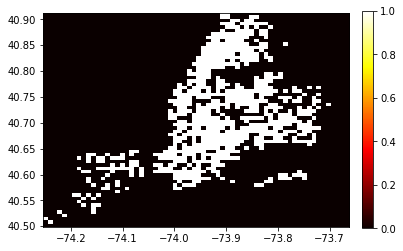

In [90]:
plt.imshow(y.reshape(64,64), interpolation='nearest', cmap='hot', origin='low',extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
plt.colorbar(fraction=0.046, pad=0.04)

#### Creating the Keras model

In [91]:
# The model
seq = Sequential()
seq.add(ConvLSTM2D(filters=64, kernel_size=(5,5), input_shape=(None, 64, 64, 1), padding='same', activation='relu', return_sequences=True))
seq.add(BatchNormalization())
seq.add(ConvLSTM2D(filters=64, kernel_size=(5,5), padding='same',  activation='relu',  return_sequences=True))
seq.add(BatchNormalization())
seq.add(ConvLSTM2D(filters=64, kernel_size=(5,5), padding='same',  activation='relu',  return_sequences=True))
seq.add(BatchNormalization())
seq.add(ConvLSTM2D(filters=64, kernel_size=(5,5),padding='same',  activation='relu',  return_sequences=False))
seq.add(BatchNormalization())
seq.add(Conv2D(filters=1, kernel_size=(5,5),activation='sigmoid',padding='same', data_format='channels_last'))

In [92]:
# Compile
seq.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.0000001), metrics=['binary_accuracy'])

In [93]:
seq.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_lst_m2d (ConvLSTM2D)    (None, None, 64, 64, 64)  416256    
_________________________________________________________________
batch_normalization (BatchNo (None, None, 64, 64, 64)  256       
_________________________________________________________________
conv_lst_m2d_1 (ConvLSTM2D)  (None, None, 64, 64, 64)  819456    
_________________________________________________________________
batch_normalization_1 (Batch (None, None, 64, 64, 64)  256       
_________________________________________________________________
conv_lst_m2d_2 (ConvLSTM2D)  (None, None, 64, 64, 64)  819456    
_________________________________________________________________
batch_normalization_2 (Batch (None, None, 64, 64, 64)  256       
_________________________________________________________________
conv_lst_m2d_3 (ConvLSTM2D)  (None, 64, 64, 64)        8

In [94]:
history_2_bin = seq.fit_generator(train_generator, epochs=10, validation_data=test_generator, callbacks=[EarlyStopping(patience=2)])

Epoch 1/10


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning:

`Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.



2190/2190 [==============================] - 584s 262ms/step - loss: 0.6045 - binary_accuracy: 0.7348 - val_loss: 0.3963 - val_binary_accuracy: 0.8825
Epoch 2/10
2190/2190 [==============================] - 580s 265ms/step - loss: 0.3801 - binary_accuracy: 0.8909 - val_loss: 0.3199 - val_binary_accuracy: 0.9162
Epoch 3/10
2190/2190 [==============================] - 580s 265ms/step - loss: 0.3117 - binary_accuracy: 0.9172 - val_loss: 0.2740 - val_binary_accuracy: 0.9307
Epoch 4/10
2190/2190 [==============================] - 579s 264ms/step - loss: 0.2738 - binary_accuracy: 0.9294 - val_loss: 0.2488 - val_binary_accuracy: 0.9383
Epoch 5/10
2190/2190 [==============================] - 578s 264ms/step - loss: 0.2521 - binary_accuracy: 0.9362 - val_loss: 0.2303 - val_binary_accuracy: 0.9428
Epoch 6/10
2190/2190 [==============================] - 579s 264ms/step - loss: 0.2344 - binary_accuracy: 0.9409 - val_loss: 0.2190 - val_binary_accuracy: 0.9459
Epoch 7/10
2190/2190 [=================

In [95]:
seq.save('/content/drive/My Drive/Colab Notebooks/final_model.h5')

In [96]:
seq.save_weights('/content/drive/My Drive/final_weights.h5')

In [97]:
history=pd.DataFrame.from_dict(history_2_bin.history)

In [98]:
history.head()

,loss,binary_accuracy,val_loss,val_binary_accuracy
0,0.515723,0.799995,0.396310,0.882503
1,0.359709,0.899541,0.319939,0.916155
2,0.301977,0.920396,0.273994,0.930713
3,0.268590,0.931166,0.248770,0.938253
4,0.247761,0.937417,0.230310,0.942826


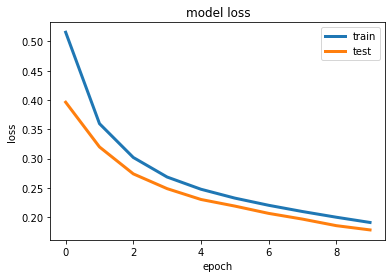

In [99]:
plt.plot(history['loss'], lw=3, )
plt.plot(history['val_loss'], lw=3)
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')

In [100]:
history.to_csv('/content/drive/My Drive/final_history.csv')

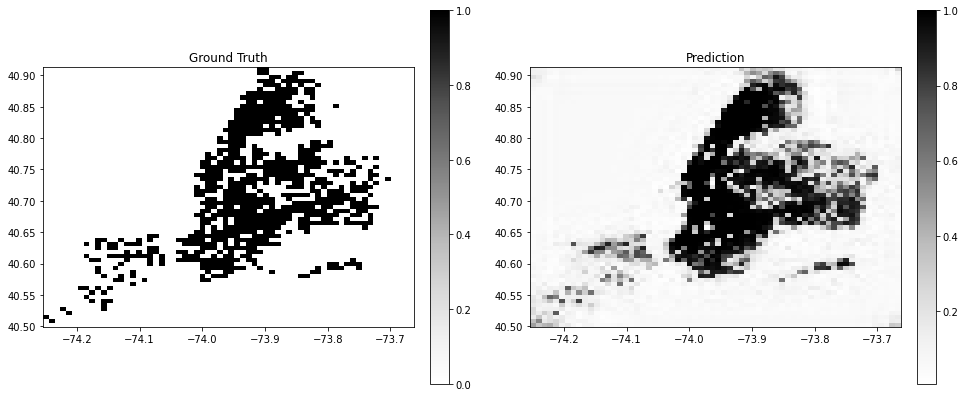

In [101]:
plt.figure(figsize=(16, 8))

plt.subplot(1,2,1)
plt.title('Ground Truth')
plt.imshow(y.reshape(64,64), interpolation='nearest', cmap='Greys', origin='low', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(1,2,2)
plt.title('Prediction')
prediction = seq.predict(X)
plt.imshow(prediction.reshape(64,64), interpolation='nearest', cmap='Greys', origin='low', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
plt.colorbar(fraction=0.046, pad=0.04)

## Conclusion
The current approach to solving the problem is relevant but requires further improvements. We can also work on the data selected and on the model type or architecture. We will keep this approach and others to further research.<br>
A classification problem requires often other evaluation metrics than the accuracy. Based on the problem faced, the customer may want to focus on lower false negatives. In this case we refer to the confusion matrix, precision, recall, f1 score and roc_auc_score

### Question IV
Extra questions: 
### Question a:
What other interesting patterns do you find in the data? <br>
--> We find very interesting patterns in:<br>
- STREET NAME<br>
- CONTRIBUTING FACTOR <br>
- VEHICLE TYPE CODE<br>
- Datetime data

In [102]:
collisions['on street name'].value_counts(ascending=False).head(10)

BROADWAY                            17155
ATLANTIC AVENUE                     15179
BELT PARKWAY                        13261
3 AVENUE                            12393
NORTHERN BOULEVARD                  11900
LONG ISLAND EXPRESSWAY               9752
FLATBUSH AVENUE                      9664
BROOKLYN QUEENS EXPRESSWAY           9599
LINDEN BOULEVARD                     9498
QUEENS BOULEVARD                     9332
Name: on street name, dtype: int64

In [103]:
collisions['contributing factor vehicle 1'].value_counts().head(20)

Unspecified                       628921
Driver Inattention/Distraction    336304
Failure to Yield Right-of-Way     100932
Following Too Closely              90165
Backing Unsafely                   66849
Other Vehicular                    55387
Fatigued/Drowsy                    47026
Turning Improperly                 43893
Passing or Lane Usage Improper     43495
Passing Too Closely                39931
Unsafe Lane Changing               34190
Traffic Control Disregarded        27625
Driver Inexperience                26070
Lost Consciousness                 19872
Pavement Slippery                  17479
Unsafe Speed                       17351
Alcohol Involvement                17229
Reaction to Uninvolved Vehicle     16036
Prescription Medication            15368
Outside Car Distraction            12098
Name: contributing factor vehicle 1, dtype: int64

In [104]:
collisions['vehicle type code 1'].value_counts().head(20)

Sedan                                  426865
PASSENGER VEHICLE                      416206
Station Wagon/Sport Utility Vehicle    341820
SPORT UTILITY / STATION WAGON          180291
Taxi                                    43256
4 dr sedan                              40007
TAXI                                    31911
Pick-up Truck                           27791
VAN                                     25266
OTHER                                   22965
UNKNOWN                                 19926
Box Truck                               18992
Bus                                     15840
LARGE COM VEH(6 OR MORE TIRES)          14397
BUS                                     13993
SMALL COM VEH(4 TIRES)                  13216
PICK-UP TRUCK                           11505
LIVERY VEHICLE                          10481
Bike                                     9787
Tractor Truck Diesel                     8070
Name: vehicle type code 1, dtype: int64

In [105]:
collisions['vehicle type code 2'].value_counts().head(20)

PASSENGER VEHICLE                      318607
Sedan                                  315001
Station Wagon/Sport Utility Vehicle    261314
SPORT UTILITY / STATION WAGON          140204
UNKNOWN                                 81441
Taxi                                    33736
4 dr sedan                              30010
TAXI                                    27702
Pick-up Truck                           25941
VAN                                     22769
OTHER                                   21690
Box Truck                               21176
Bike                                    20291
BICYCLE                                 18554
Bus                                     14183
LARGE COM VEH(6 OR MORE TIRES)          13687
SMALL COM VEH(4 TIRES)                  12962
BUS                                     11502
PICK-UP TRUCK                           10672
LIVERY VEHICLE                           8458
Name: vehicle type code 2, dtype: int64

In [106]:
# Vehicle type "BICYCLE " mentions in the collisions dataframe
len(collisions[(collisions['vehicle type code 1'] =='BICYCLE') | (collisions['vehicle type code 2'] =='BICYCLE')])

19108

In [107]:
# Vehicle type "BICYCLE " mentions in the cyclists dataframe
len(cyclists[(cyclists['vehicle type code 1'] =='BICYCLE') | (cyclists['vehicle type code 2'] =='BICYCLE')])

14851

##### The Years by boroughs

In [108]:
collisions['year'] = collisions.index.year
collisions['month'] = collisions.index.month
collisions['day'] = collisions.index.day_name()
collisions['hour'] = collisions.index.hour

In [109]:
collisions['incidents'] = 1

In [110]:
collisions_year = collisions.groupby(['year','borough']).count().iloc[:,-1:]

In [111]:
collisions_year.head()

incidents
year borough                 
2012 BRONX               9511
     BROOKLYN           23303
     MANHATTAN          20720
     QUEENS             19137
     STATEN ISLAND       4902

In [112]:
collisions_year = collisions_year.reset_index()

In [113]:
fig = px.line(collisions_year, x="year", y="incidents", color='borough')
fig.show()

Manhattan has radically been inproving its figures from 2015. The general findings we got before are proved on a yearly bases.  

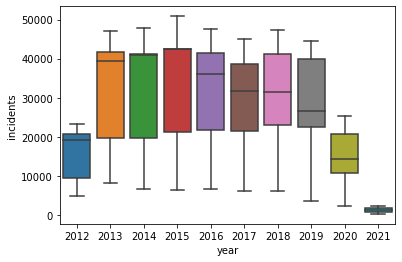

In [114]:
sns.boxplot(data=collisions_year, x='year', y='incidents')

From 2019, the data has been showing a decrease in incident records. In 2020, we notice a radical drop to 2012 values (we suspect it s covid restrictions relations)

#### The Months

In [115]:
collisions_year_month = collisions.groupby(['year','month','borough']).count().iloc[:,-1:]

In [116]:
collisions_year_month.head()

incidents
year month borough                 
2012 7     BRONX               1641
           BROOKLYN            3885
           MANHATTAN           3654
           QUEENS              3204
           STATEN ISLAND        768

In [117]:
collisions_year_month = collisions_year_month.reset_index()

In [118]:
collisions_year_month[collisions_year_month['year']== 2019].head()

,year,month,borough,incidents
390,2019,1,BRONX,1768
391,2019,1,BROOKLYN,3510
392,2019,1,MANHATTAN,2127
393,2019,1,QUEENS,3199
394,2019,1,STATEN ISLAND,464


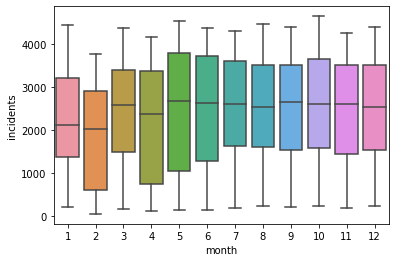

In [119]:
sns.boxplot(data=collisions_year_month, x='month', y='incidents')

The montly records are pretty steady with slightly lower values in winter seasons and an increase from Mai

In [120]:
fig = px.line(collisions_year_month[collisions_year_month['year']== 2020], x="month", y="incidents", title='2020 NYC collisions records' ,color='borough')
fig.show()

The April 2020 sudden drop in records supports our supposition of the effects of covid restrictions effects (A quick check online supports this too but has to be confirmed) 

In [121]:
fig = px.line(collisions_year_month[collisions_year_month['year']== 2019], x="month", y="incidents",title='2019 NYC collisions records',  color='borough')
fig.show()

In [122]:
fig = px.line(collisions_year_month[collisions_year_month['year']== 2016], x="month", y="incidents",title='2016 NYC collisions records',  color='borough')
fig.show()

In [123]:
fig = px.line(collisions_year_month[collisions_year_month['year']== 2015], x="month", y="incidents",title='2015 NYC collisions records',  color='borough')
fig.show()

In [124]:
fig = px.line(collisions_year_month[collisions_year_month['year']== 2014], x="month", y="incidents",title='2014 NYC collisions records',  color='borough')
fig.show()

#### The days 

In [125]:
collisions_year_month_day = collisions.groupby(['year','month','day','borough']).count().iloc[:,-1:]

In [126]:
collisions_year_month_day = collisions_year_month_day.reset_index()

In [127]:
collisions_year_month_day.head()

,year,month,day,borough,incidents
0,2012,7,Friday,BRONX,218
1,2012,7,Friday,BROOKLYN,536
2,2012,7,Friday,MANHATTAN,562
3,2012,7,Friday,QUEENS,489
4,2012,7,Friday,STATEN ISLAND,121


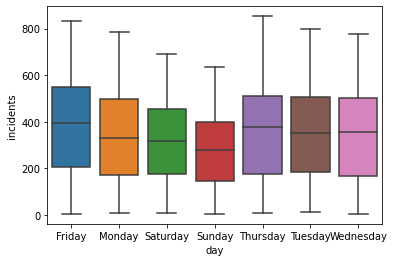

In [128]:
sns.boxplot(data=collisions_year_month_day, x='day', y='incidents')

The weekend records are lowers compaired to the rest of the active week. 

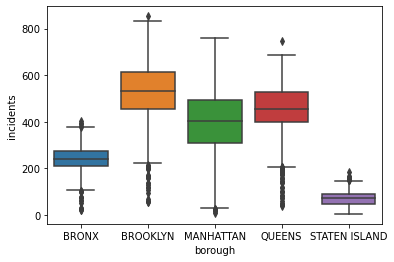

In [129]:
sns.boxplot(data=collisions_year_month_day, x='borough', y='incidents')

#### The Hours

In [130]:
collisions_year_month_hour = collisions.groupby(['year','month','day','hour','borough']).count().iloc[:,-1:]

In [131]:
collisions_year_month_hour.head(20)

incidents
year month day    hour borough                 
2012 7     Friday 0    BRONX                  4
                       BROOKLYN              10
                       MANHATTAN             16
                       QUEENS                 4
                  1    BRONX                  3
                       BROOKLYN               4
                       MANHATTAN              7
                       QUEENS                10
                       STATEN ISLAND          1
                  2    BRONX                  4
                       BROOKLYN               3
                       MANHATTAN             10
                       QUEENS                 5
                  3    BRONX                  1
                       BROOKLYN               3
                       MANHATTAN              9
                       QUEENS                 2
                       STATEN ISLAND          1
                  4    BRONX                  1
                       BROOKLYN               2

In [132]:
collisions_year_month_hour = collisions_year_month_hour.reset_index()

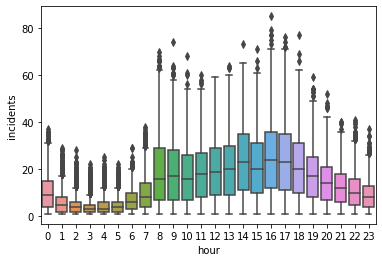

In [133]:
sns.boxplot(data=collisions_year_month_hour, x='hour', y='incidents')

There are higher risks of collisions during the standard active hours of the day from 8am -10pm

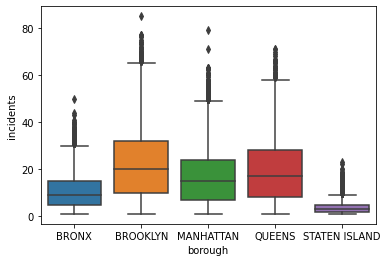

In [134]:
sns.boxplot(data=collisions_year_month_hour, x='borough', y='incidents')

Brooklyn keeps the highest levels of risks even by hourly data

Note: Similar analysis can be done to only the cyclists or even to the trio [pedestrian, cyclists, bikes]

#### Question b:

What other data sources would be interesting to correlate?  <br>
- Cycling conditions / pathways <br>
- Traffic conditions <br>
- Weather <br>
- Populations / cyclists / communities
- Activities (entertainment, work, restauration)